<a href="https://colab.research.google.com/github/Andresmup/OpenCV-Digphato/blob/main/OpenCV_Digphato.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **ANDRÉS MUÑOZ PAMPILLÓN - PRUEBA OPENCV DIGITAL PATHOLOGY LAB**

## IMPORT AND PREPARATION

Import libraries required

In [1]:
import torch
import torchvision
print(f"torch version: {torch.__version__}")
print(f"torchvision version: {torchvision.__version__}")

torch version: 2.3.0+cu121
torchvision version: 0.18.0+cu121


In [2]:
from torchvision import transforms

from PIL import Image

import matplotlib
import matplotlib.pyplot as plt
matplotlib.rcParams['font.size'] = 8

import io

import os

import numpy as np
import skimage as ski

import cv2
from google.colab.patches import cv2_imshow

import zipfile
from pathlib import Path

Unzip content in a folder

In [3]:
# Define the path where the unzipped files will be stored
label_path = Path("opencv")

# Unzip the file 'TestCV.zip'
# 'zipfile.ZipFile' opens the zip file in read mode ("r")
with zipfile.ZipFile("TestCV.zip", "r") as zip_ref:
    # Print a message indicating that the unzip process is starting
    print("Unzipping OpenCV files...")

    # Extract all contents of the zip file to the specified directory 'label_path'
    zip_ref.extractall(label_path)

Unzipping OpenCV files...


## ORIGINAL IMAGE VISUALIZATION

Define Test1 image path, show dimentions and display it for check purpose.

The image size is (1280, 720)


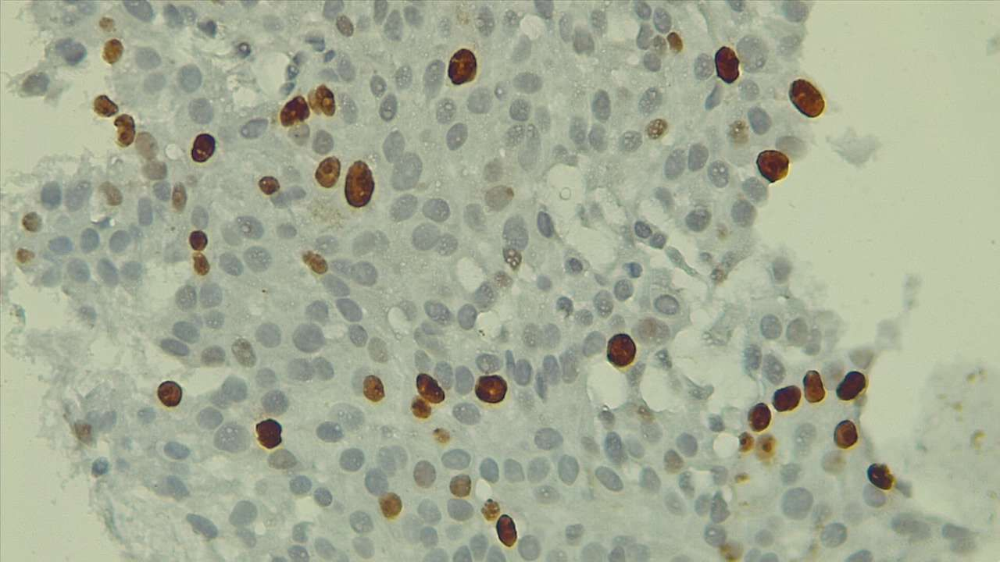

In [4]:
# Open the image file 'Test1.jpg' located in the directory specified by label_path
img_test1 = Image.open(label_path / 'Test1.jpg')

# Print the size of the image (width, height)
print(f"The image size is {img_test1.size}")

# Display the image
img_test1

## RESIZE IMAGE

Resize test1 image, in the desired width and height and display it

The resized image size is (1024, 1024)


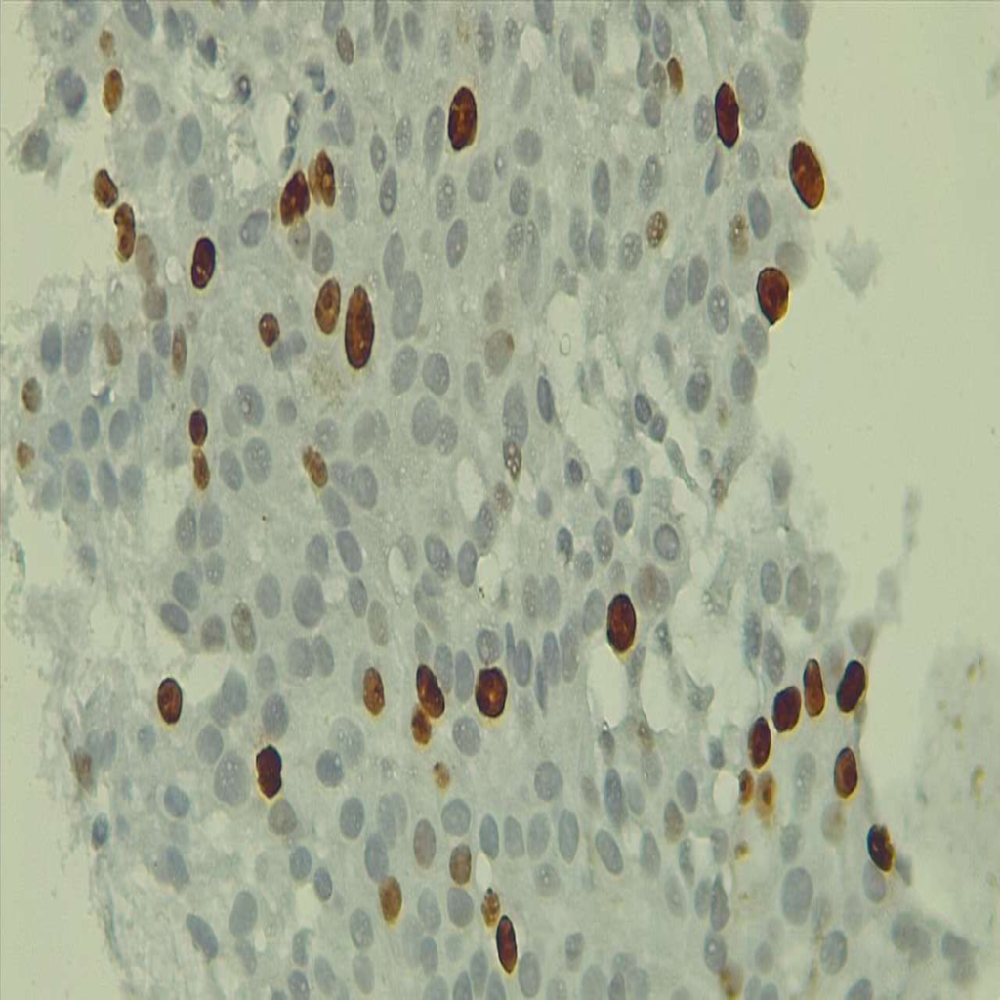

In [5]:
# Define the desired width and height for resizing the image
width, height = 1024, 1024

# Define the half width and height (not used in this snippet but possibly for future operations)
width_sub, height_sub = int(width / 2), int(height / 2)

# Create a transformation pipeline to resize the image to the specified width and height
resize_test1 = transforms.Compose([
    transforms.Resize((width, height))
])

# Apply the resizing transformation to 'img_test1'
img_test1_resize = resize_test1(img_test1)

# Print the size of the resized image
print(f"The resized image size is {img_test1_resize.size}")

# Display the resized image
img_test1_resize


## SPLIT IMAGE

Split the resize test1 image in 4 equals parts.

In [6]:
# Create a transformation pipeline to convert the image to a tensor
tensor_test1 = transforms.Compose([
    transforms.ToTensor()
])

# Apply the tensor transformation to the resized image
tensor_test1_resize = tensor_test1(img_test1_resize)

# Print the shape of the image tensor
print(f"Shape of the image tensor: {tensor_test1_resize.shape}")

# Split the tensor into four quadrants
# Extract the upper left quadrant of the tensor
upper_left = tensor_test1_resize[:, :width_sub, :height_sub]

# Extract the upper right quadrant of the tensor
upper_right = tensor_test1_resize[:, :width_sub, height_sub:]

# Extract the lower left quadrant of the tensor
lower_left = tensor_test1_resize[:, width_sub:, :height_sub]

# Extract the lower right quadrant of the tensor
lower_right = tensor_test1_resize[:, width_sub:, height_sub:]

# Store the four quadrants in a list
sub_tensor = [upper_left, upper_right, lower_left, lower_right]

# Print the shape of each quadrant
print(f"Shape of part1: {upper_left.shape}")
print(f"Shape of part2: {upper_right.shape}")
print(f"Shape of part3: {lower_left.shape}")
print(f"Shape of part4: {lower_right.shape}")

Shape of the image tensor: torch.Size([3, 1024, 1024])
Shape of part1: torch.Size([3, 512, 512])
Shape of part2: torch.Size([3, 512, 512])
Shape of part3: torch.Size([3, 512, 512])
Shape of part4: torch.Size([3, 512, 512])


Create new jpg images of resized image and the 4 quadrants.

In [7]:
# Create a transformation pipeline to convert a tensor back to a PIL image
image_test1 = transforms.Compose([
    transforms.ToPILImage()
])

# Check if the directory 'quadrant' exists, if not, create it
if not os.path.exists("quadrant"):
    os.makedirs("quadrant")

# Save the upper left quadrant of the image as 'upper_left.jpg' in the 'quadrant' directory
image_test1(upper_left).save("quadrant/upper_left.jpg")

# Save the upper right quadrant of the image as 'upper_right.jpg' in the 'quadrant' directory
image_test1(upper_right).save("quadrant/upper_right.jpg")

# Save the lower left quadrant of the image as 'lower_left.jpg' in the 'quadrant' directory
image_test1(lower_left).save("quadrant/lower_left.jpg")

# Save the lower right quadrant of the image as 'lower_right.jpg' in the 'quadrant' directory
image_test1(lower_right).save("quadrant/lower_right.jpg")

# Save the resized full image as 'test1_resize.jpg' in the current directory
image_test1(tensor_test1_resize).save("test1_resize.jpg")



Show the quadrants

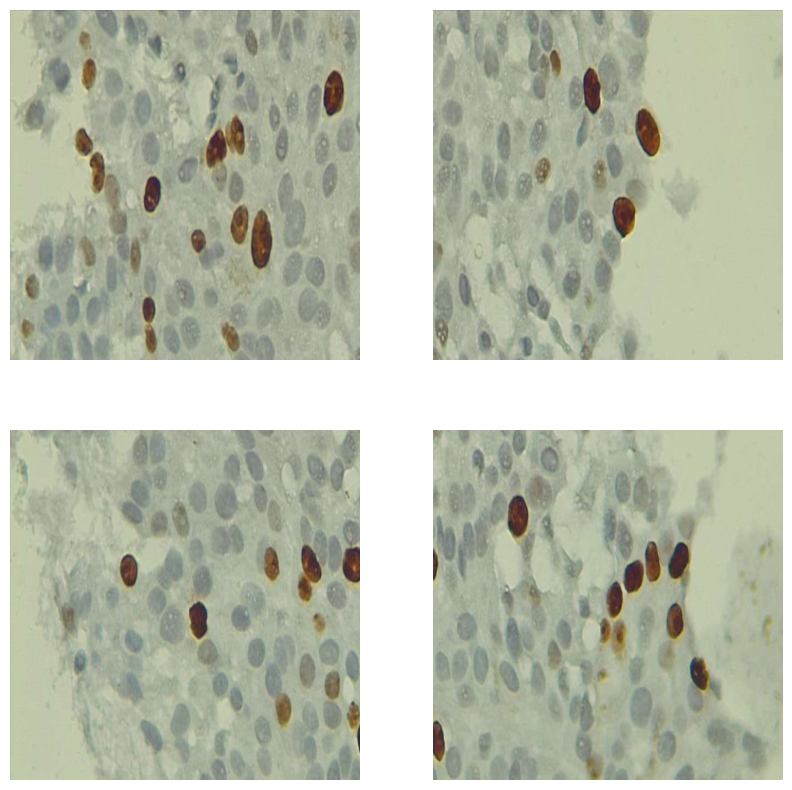

In [8]:
# Create a 2x2 grid of subplots with a figure size of 10x10 inches
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Iterate over each axis and corresponding sub-image (quadrant)
for ax, sub_img in zip(axes.flat, sub_tensor):
    # Display the sub-image on the current axis
    # permute(1, 2, 0) rearranges the dimensions from (C, H, W) to (H, W, C) for displaying
    ax.imshow(sub_img.permute(1, 2, 0))

    # Remove the axis ticks and labels
    ax.axis('off')

# Show the figure with the 2x2 grid of images
plt.show()


## COLOR CHANNEL HISTOGRAM

Create a function to plot the image and the histogram of its color channels

In [9]:
def plot_histogram(file_path):
    """
    Plot the image and histograms of its color channels side by side.

    Arguments:
    file_path -- path to the image file

    Output:
    Displays the original image and its histograms (total and per channel) using matplotlib.
    """
    # Read the image from the file using scikit-image
    image = ski.io.imread(file_path)

    # Create a figure with two subplots: one for the image and one for the histograms
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    # Set the main title of the figure
    fig.suptitle(f"Histogram of color channels: {file_path}", fontweight="bold", fontsize=14, y=1.02)

    # Display the original image on the first subplot
    axes[0].imshow(image)
    axes[0].set_title(f'Image: {file_path}')
    axes[0].axis('off')

    # Configure the second subplot for the histograms
    axes[1].set_title(f'Histogram: {file_path}')
    axes[1].hist(image.ravel(), bins=256, color='grey')  # Total histogram of all channels in gray
    axes[1].hist(image[:, :, 0].ravel(), bins=256, color='Red', alpha=0.5)    # Red channel histogram in red with transparency
    axes[1].hist(image[:, :, 1].ravel(), bins=256, color='Green', alpha=0.5)  # Green channel histogram in green with transparency
    axes[1].hist(image[:, :, 2].ravel(), bins=256, color='Blue', alpha=0.5)   # Blue channel histogram in blue with transparency
    axes[1].set_xlabel('Pixel Level')    # X-axis label
    axes[1].set_ylabel('Frequency')     # Y-axis label
    axes[1].legend(['Total (3 channels)', 'Red', 'Green', 'Blue'])   # Legend for the histograms

    # Display the plot
    plt.show()


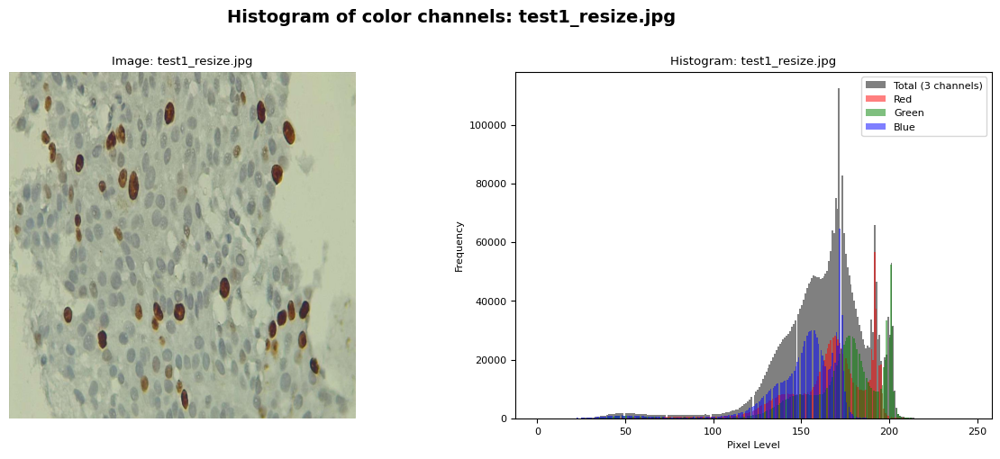

In [10]:
plot_histogram("test1_resize.jpg")

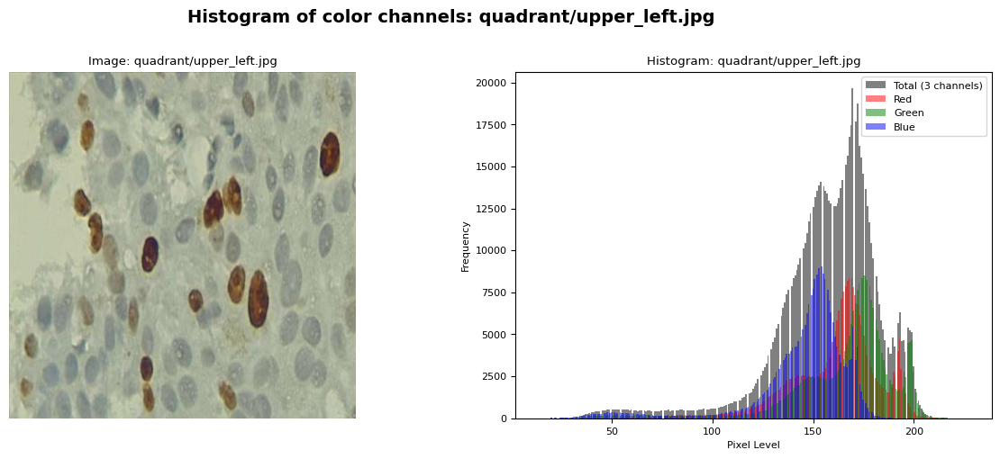

In [11]:
plot_histogram("quadrant/upper_left.jpg")

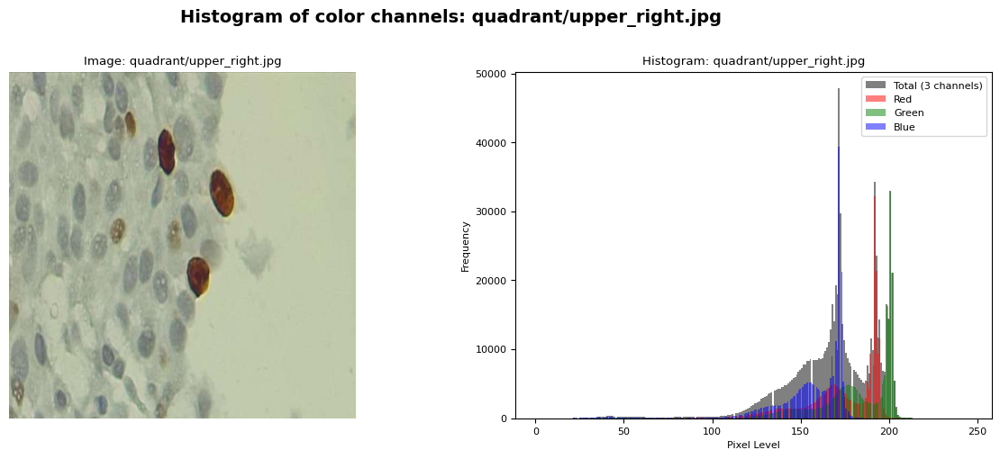

In [12]:
plot_histogram("quadrant/upper_right.jpg")

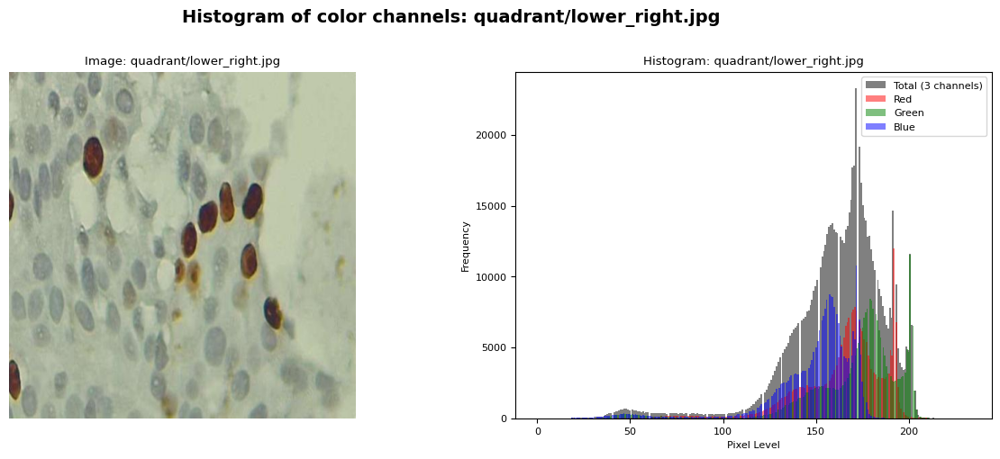

In [13]:
plot_histogram("quadrant/lower_right.jpg")

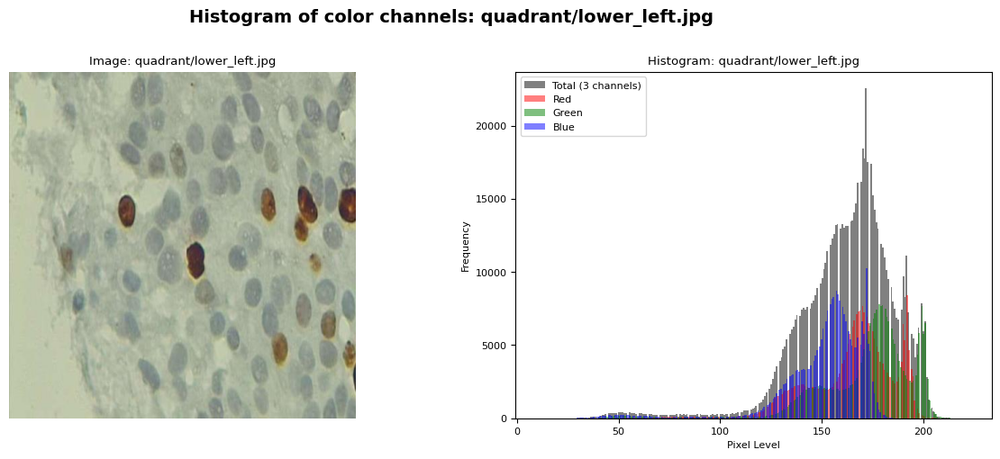

In [14]:
plot_histogram("quadrant/lower_left.jpg")

## IMAGE EQUALIZATION

Create a function to save numpy arrays as image in a desired filepath with a color map of choice.

In [15]:
def save_array_image(array, file_name, prefix, cmap):
    """
    Save a NumPy array as an image file.

    Arguments:
    array -- NumPy array containing the image data
    file_name -- name of the file to save
    prefix -- directory path where the file will be saved
    cmap -- colormap to apply when saving the image (optional)

    Output:
    Saves the array as an image file in the specified directory.
    If cmap is specified, it applies the colormap; otherwise, it defaults to 'gray'.
    """
    # Create the directory if it doesn't exist
    if not os.path.exists(prefix):
        os.makedirs(prefix)

    # Save the array as an image file with the specified colormap (or default to 'gray')
    if cmap is not None:
        plt.imsave(os.path.join(prefix, file_name), array, cmap=cmap)
    else:
        plt.imsave(os.path.join(prefix, file_name), array, cmap='gray')


Define a function to perform histogram equalization on an image and return each equalized channel.

In [16]:
def equalize_this(image_file):
    """
    Perform histogram equalization on an image.

    Arguments:
    image_file -- path to the image file

    Output:
    Returns the original image, the equalized image, and individual equalized channels (R, G, B).
    """
    # Read the image using scikit-image
    image_ori = ski.io.imread(image_file)

    # Convert the color space from BGR to RGB (assuming input image is in BGR format)
    image_src = cv2.cvtColor(image_ori, cv2.COLOR_BGR2RGB)

    # Split the image into its RGB channels
    r_image, g_image, b_image = cv2.split(image_src)

    # Perform histogram equalization on each channel separately
    r_image_eq = cv2.equalizeHist(r_image)
    g_image_eq = cv2.equalizeHist(g_image)
    b_image_eq = cv2.equalizeHist(b_image)

    # Merge the equalized channels back into an RGB image
    image_eq = cv2.merge((r_image_eq, g_image_eq, b_image_eq))

    # Return the original image, equalized image, and individual equalized channels
    return image_ori, image_eq, r_image_eq, g_image_eq, b_image_eq


Define a function to show the equalization results, and compare side by side.

In [17]:
def plot_equalize(file_path):
    """
    Perform histogram equalization on an image and plot a comparison of the original and equalized images,
    as well as the equalized channels (R, G, B).

    Arguments:
    file_path -- path to the image file

    Output:
    Displays a figure with subplots showing the original image, equalized image, and equalized channels.
    Saves the equalized images and channels as separate files.
    """
    # Perform histogram equalization on the image and retrieve results
    image_ori, image_eq, r_image_eq, g_image_eq, b_image_eq = equalize_this(image_file=file_path)

    # Create a figure with 1 row and 5 columns for subplots
    fig, axes = plt.subplots(1, 5, figsize=(20, 5))

    # Set the title for the entire figure
    fig.suptitle(f"Comparison: {file_path}", fontweight="bold", fontsize=14, y=0.9)

    # Plot the original image on the first subplot
    axes[0].imshow(image_ori)
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    # Save and plot the equalized image on the second subplot
    save_array_image(image_eq, "Equalized.jpg", file_path[:-4], cmap=None)
    axes[1].imshow(image_eq)
    axes[1].set_title('Equalized Image')
    axes[1].axis('off')

    # Save and plot the equalized red channel on the third subplot
    save_array_image(r_image_eq, "Red.jpg", file_path[:-4], cmap='Reds')
    axes[2].imshow(r_image_eq, cmap='Reds')
    axes[2].set_title('Red Channel Equalized')
    axes[2].axis('off')

    # Save and plot the equalized green channel on the fourth subplot
    save_array_image(g_image_eq, "Green.jpg", file_path[:-4], cmap='Greens')
    axes[3].imshow(g_image_eq, cmap='Greens')
    axes[3].set_title('Green Channel Equalized')
    axes[3].axis('off')

    # Save and plot the equalized blue channel on the fifth subplot
    save_array_image(b_image_eq, "Blue.jpg", file_path[:-4], cmap='Blues')
    axes[4].imshow(b_image_eq, cmap='Blues')
    axes[4].set_title('Blue Channel Equalized')
    axes[4].axis('off')

    # Display the figure with all subplots
    plt.show()


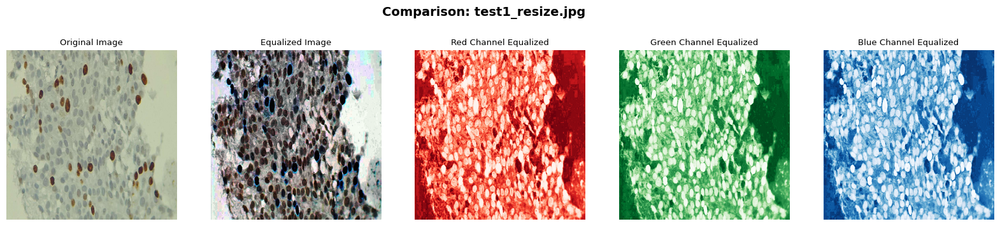

In [18]:
plot_equalize("test1_resize.jpg")

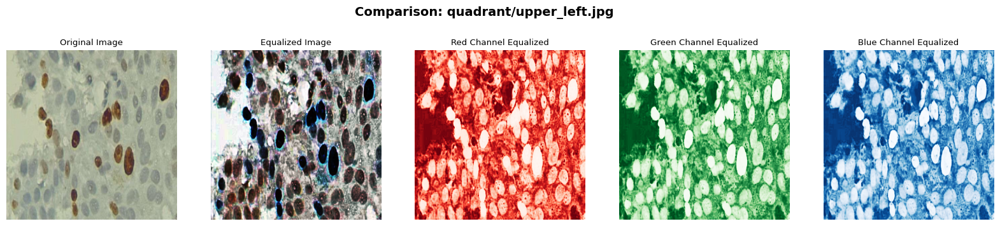

In [19]:
plot_equalize("quadrant/upper_left.jpg")

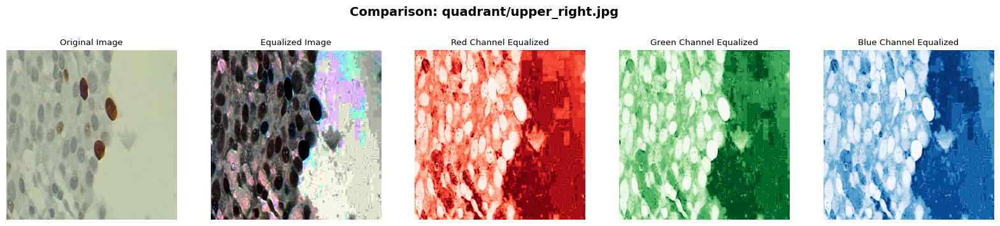

In [20]:
plot_equalize("quadrant/upper_right.jpg")

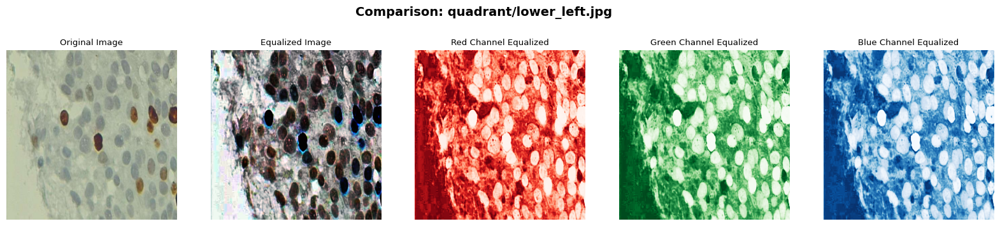

In [21]:
plot_equalize("quadrant/lower_left.jpg")

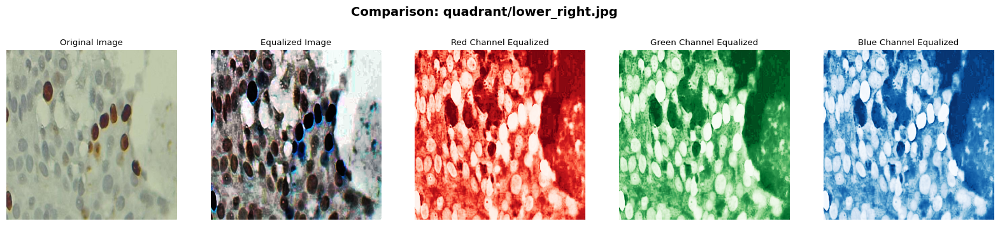

In [22]:
plot_equalize("quadrant/lower_right.jpg")

## MASK PREPARATION

Open and inspect the mask tif file, save it as png

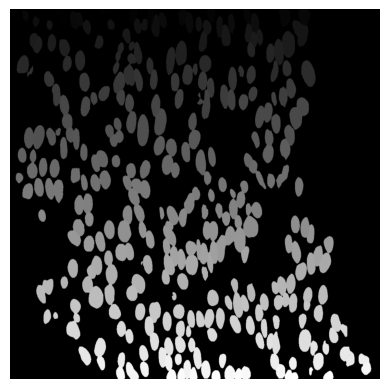

In [23]:
# Read the mask image from the file 'opencv/MASK.tif' using scikit-image
img_mask = ski.io.imread('opencv/MASK.tif')

# Resize the mask image to dimensions (1250, 1250) using anti-aliasing for smoother edges
resized_mask = ski.transform.resize(img_mask, (1250, 1250), anti_aliasing=True)

# Display the resized mask image using a colormap ('Blues')
plt.imshow(resized_mask, cmap='gray')

# Turn off axis labels and ticks
plt.axis('off')

# Save the displayed image as 'mask.png' with transparency, high DPI, and tight bounding box
plt.savefig('mask.png', transparent=True, dpi=300, bbox_inches="tight", pad_inches=0.0)


## OPENING KERNEL COMPARISON

Create a function that apply a morphological opening of a desired size to a image

In [24]:
def opening(image, size):
    """
    Perform morphological opening on a binary image.

    Arguments:
    image -- input binary image (numpy array)
    size -- size of the square structuring element (kernel size)

    Output:
    Returns the result of morphological opening as a binary image (numpy array).
    """
    # Create a square structuring element (kernel) of size (size x size)
    kernel = np.ones((size, size), np.uint8)

    # Perform morphological opening on the input image using the defined kernel
    opening = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)

    # Apply binary thresholding to convert the result to a binary image
    _, opening_binary = cv2.threshold(opening, 1, 255, cv2.THRESH_BINARY)

    # Return the binary image resulting from morphological opening
    return opening_binary

Define a function that takes the original image, and comparare with the image result of the morphological opening. With the information of the count cell and the average area of each ones.

In [25]:
def plot_count_cell(file_path, size):
    """
    Perform morphological opening on a binary image and plot a comparison between the original and processed images.

    Arguments:
    file_path -- path to the image file
    size -- size of the square structuring element (kernel size) for morphological opening

    Output:
    Displays a figure with subplots showing the original binary image and the result of morphological opening.
    """
    # Read and convert the input image to grayscale
    mask_scr = ski.io.imread(file_path)
    mask_img = cv2.cvtColor(mask_scr, cv2.COLOR_BGR2GRAY)

    # Perform morphological opening on the grayscale image
    opening_img = opening(mask_img, size)

    # Perform connected component analysis on the original image
    num_labels_original, labels_original, stats_original, centroids_original = cv2.connectedComponentsWithStats(mask_img, connectivity=8)
    object_stats_original = stats_original[1:]
    areas_original = object_stats_original[:, cv2.CC_STAT_AREA]
    mean_area_original = round(np.mean(areas_original))

    # Perform connected component analysis on the opened image
    num_labels_opening, labels_opening, stats_opening, centroids_opening = cv2.connectedComponentsWithStats(opening_img, connectivity=8)
    object_stats_opening = stats_opening[1:]
    areas_opening = object_stats_opening[:, cv2.CC_STAT_AREA]
    mean_area_opening = round(np.mean(areas_opening))

    # Create a figure with 1 row and 2 columns for subplots
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    # Set the title for the entire figure
    fig.suptitle(f"Comparison between original and post opening", fontweight="bold", fontsize=14)

    # Plot the original binary image on the first subplot
    axes[0].imshow(mask_img, cmap='gray')
    axes[0].set_title(f'Original\n Cell count: {len(object_stats_original)} - Mean area {mean_area_original}')
    axes[0].axis('off')

    # Plot the result of morphological opening on the second subplot
    axes[1].imshow(opening_img, cmap='Purples')
    axes[1].set_title(f'Opening kernel {size} x {size}\n Cell count: {len(object_stats_opening)} - Mean area {mean_area_opening}')
    axes[1].axis('off')

    # Display the figure with all subplots
    plt.show()

Run with different kernel size.

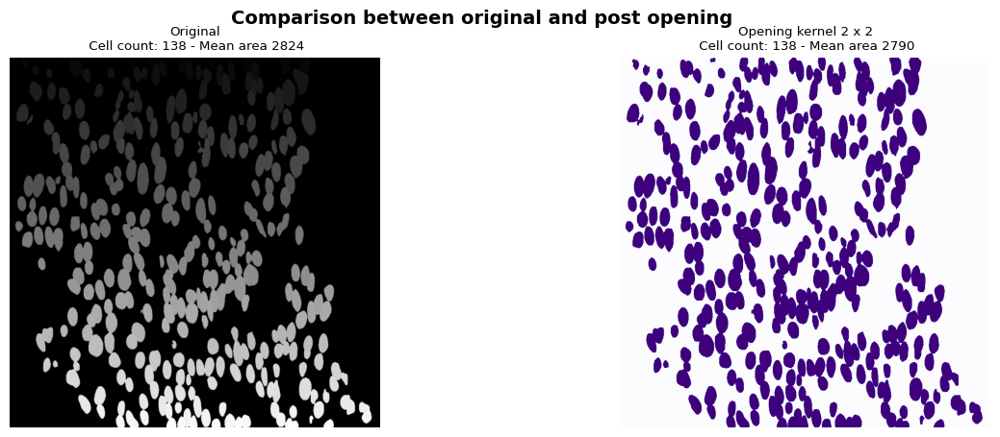

In [26]:
plot_count_cell('mask.png',2)

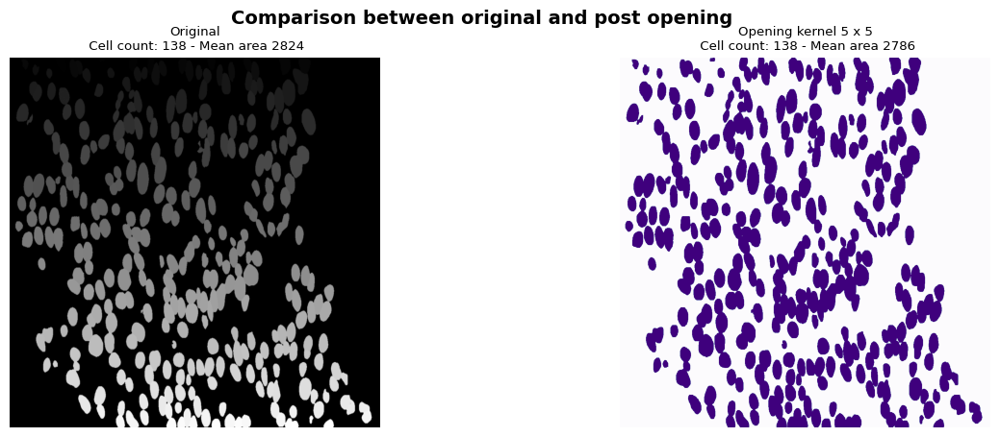

In [27]:
plot_count_cell('mask.png',5)

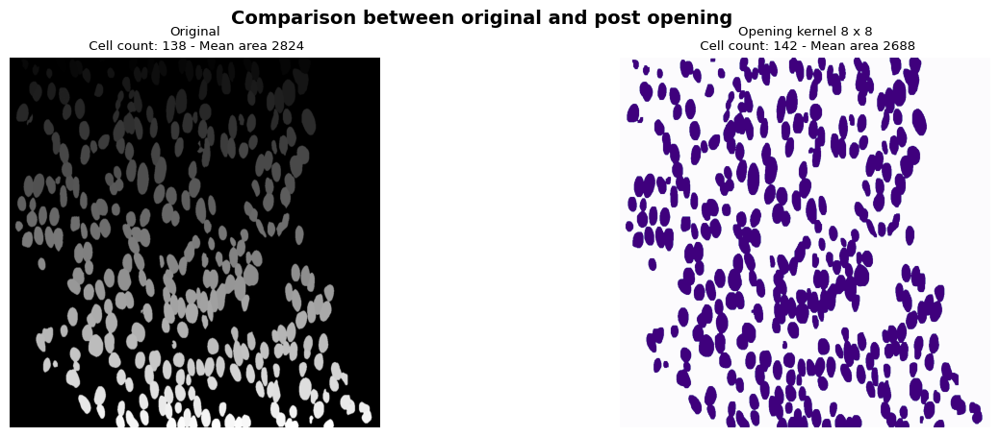

In [28]:
plot_count_cell('mask.png',8)

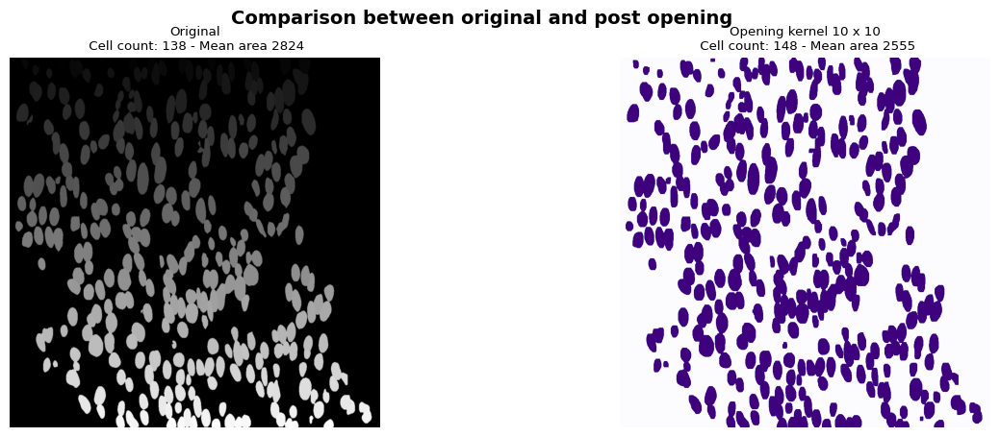

In [29]:
plot_count_cell('mask.png',10)

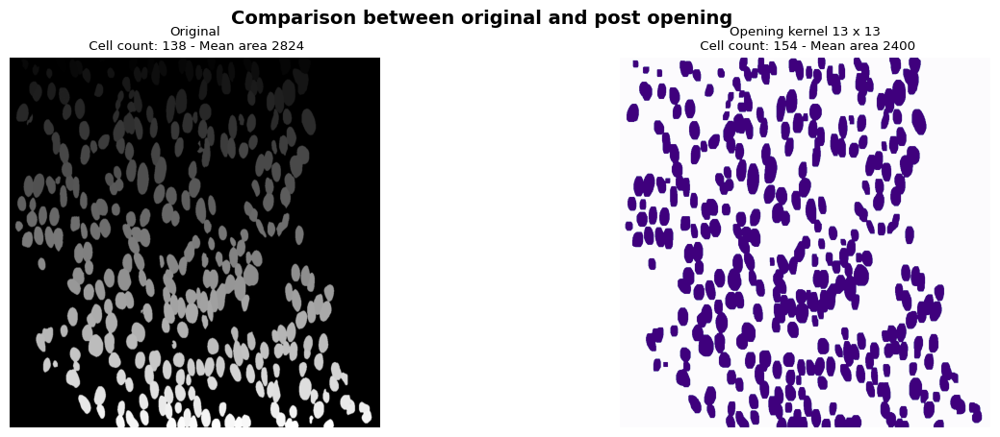

In [30]:
plot_count_cell('mask.png',13)

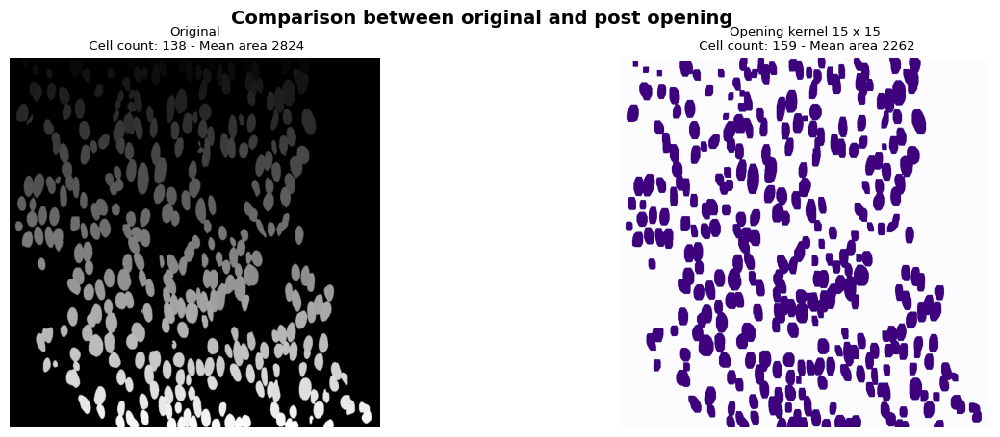

In [31]:
plot_count_cell('mask.png',15)

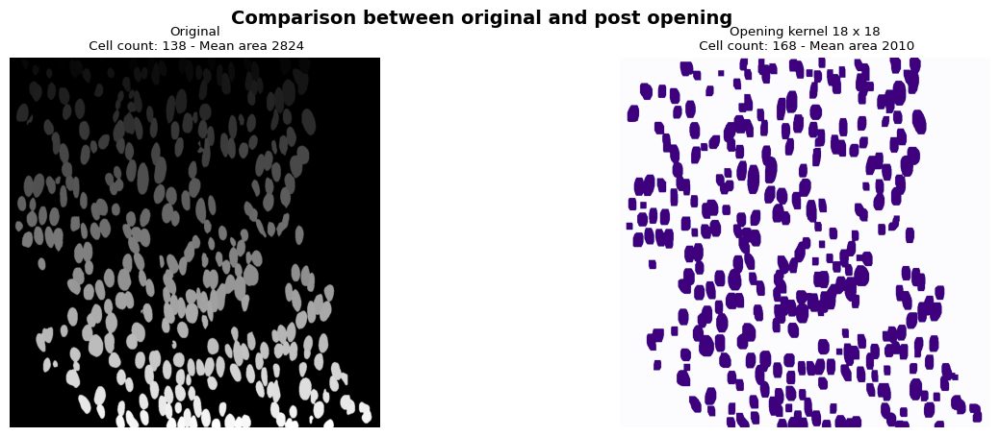

In [32]:
plot_count_cell('mask.png',18)

## OPENING IMPLEMENTATION

Implement the morphological opening with the kernel decided, and create a png image of the result

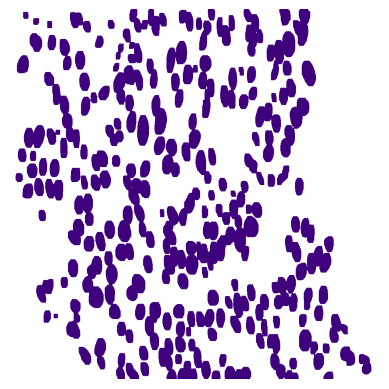

In [33]:
# Read the RGBA image 'mask.png' using scikit-image and convert it to grayscale
mask_scr = ski.io.imread('mask.png')
mask_img = cv2.cvtColor(mask_scr, cv2.COLOR_BGR2GRAY)

# Perform morphological opening on the grayscale image using a kernel size of 13
opening_img = opening(mask_img, 13)

# Apply a colormap ('Purples') to the opening result for visualization
colormap = plt.get_cmap('Purples')
colored_img = colormap(opening_img / 255.0)  # Normalize opening_img to [0, 1] for colormap application

# Create an alpha channel based on the opening_img values (0 for background, 1 for foreground)
alpha_channel = np.ones_like(opening_img, dtype=float)
alpha_channel[opening_img == 0] = 0

# Create an RGBA image by combining the colored_img with alpha_channel
rgba_img = np.dstack((colored_img[:, :, :3], alpha_channel))

# Save the RGBA image with transparency as 'opening_mask.png'
plt.imsave('opening_mask.png', rgba_img)

# Display the RGBA image with transparency using matplotlib
plt.imshow(rgba_img)
plt.axis('off')
plt.show()

## FINAL IMAGE COMBINATION

Combine the original test1 resize image with the image result of the morphological opening. Plot the result and save the file.

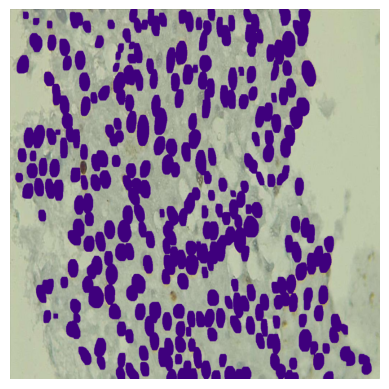

In [34]:
# Read the images into NumPy arrays using scikit-image
test1_image = ski.io.imread("test1_resize.jpg")
opening_mask_image = ski.io.imread('opening_mask.png')

# Convert NumPy arrays to PIL Image objects
test1_image_pil = Image.fromarray(test1_image)
opening_mask_image_pil = Image.fromarray(opening_mask_image)

# Resize the opening_mask_image_pil to match the size of test1_image_pil using Lanczos interpolation
opening_mask_image_pil = opening_mask_image_pil.resize(test1_image_pil.size, Image.LANCZOS)

# Create a copy of test1_image_pil
combined_image = test1_image_pil.copy()

# Paste the resized opening_mask_image_pil onto combined_image at position (0, 0) with the alpha channel
combined_image.paste(opening_mask_image_pil, (0, 0), opening_mask_image_pil)

# Display the combined_image image using matplotlib
plt.imshow(combined_image)
plt.axis('off')
plt.show()

# Save the combined_image as 'combined_image.png'
combined_image.save("combined_image.png")

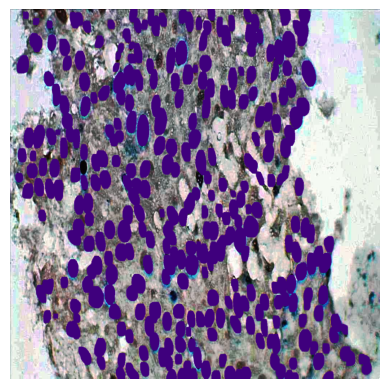

In [35]:
# Read the images into NumPy arrays using scikit-image
test1_image = ski.io.imread("test1_resize/Equalized.jpg")
opening_mask_image = ski.io.imread('opening_mask.png')

# Convert NumPy arrays to PIL Image objects
test1_image_pil = Image.fromarray(test1_image)
opening_mask_image_pil = Image.fromarray(opening_mask_image)

# Resize the opening_mask_image_pil to match the size of test1_image_pil using Lanczos interpolation
opening_mask_image_pil = opening_mask_image_pil.resize(test1_image_pil.size, Image.LANCZOS)

# Create a copy of test1_image_pil
combined_equalized = test1_image_pil.copy()

# Paste the resized opening_mask_image_pil onto combined_equalized at position (0, 0) with the alpha channel
combined_equalized.paste(opening_mask_image_pil, (0, 0), opening_mask_image_pil)

# Display the combined_equalized image using matplotlib
plt.imshow(combined_equalized)
plt.axis('off')
plt.show()

# Save the combined_equalized as 'combined_equalized.png'
combined_equalized.save("combined_equalized.png")